In [2]:
# Importer les libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tweepy
import pandas as pd
#from dataprep.eda import create_report
import contractions
import re
import string
from textblob import TextBlob
from nltk.tokenize import word_tokenize
import nltk

nltk.download("stopwords")
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))
nltk.download('brown')
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from wordcloud import WordCloud
import gensim
from gensim import corpora
from gensim.models import CoherenceModel
import warnings
warnings.filterwarnings("ignore")
import pyLDAvis
import pyLDAvis.gensim #dont skip this
from gensim.utils import simple_preprocess
import time
from tweepy.auth import OAuthHandler
import jsonpickle
import csv
import time
stop_words = stopwords.words('english')
import os

import pyLDAvis.gensim_models as gensimvis
import pickle 
import pyLDAvis



[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Extra\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [3]:
# Importer le dataset
data_fake=pd.read_csv('fake_or_real_news.csv')

In [4]:
data_fake

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [5]:
data_fake.head(5)

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [6]:
data_fake.shape

(6335, 4)

In [7]:
data_fake.columns

Index(['Unnamed: 0', 'title', 'text', 'label'], dtype='object')

In [8]:
data_fake = data_fake.rename(columns={"Unnamed: 0": "tweet_id"})

In [9]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [10]:
data_fake.to_csv("new_fake_or_real_news.csv", index=False)

In [11]:
data_fake=pd.read_csv('new_fake_or_real_news.csv')

In [12]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [13]:
data_fake.shape

(6335, 4)

# Twitter Api Streaming

In [14]:
def classify_tweet(tweet_text):
    real_news_keywords = ["breaking news", "latest news", "developing story"]
    fake_news_keywords = ["hoax", "fake", "conspiracy"]

    for keyword in real_news_keywords:
        if keyword in tweet_text.lower():
            return "REAL"

    for keyword in fake_news_keywords:
        if keyword in tweet_text.lower():
            return "FAKE"

    return "unknown"

In [15]:
st = time.time()

In [16]:
consumer_key = "nV211cauWjRmdu9a613t7bXON"
consumer_secret = "BhUXQCxACTexmi0Y1A7qvpLaAKrIKfnJCphlWYhjTmP33wNYkb"
access_token = "4559785366-e3uLZEyJhIxTf4Gu01s99FS1CnZ5cONLiUmyj4C"
access_token_secret =  "etuvGy3TxNjuua0NDNu1WgyfenNgauhSXtSxLRl729Qpl"
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

In [17]:
tweetsPerQuery = 10 #this is the maximum provided by API
max_tweets = 5000 # just for the sake of While loop
fName = 'tweets.txt' # where i save the tweets
search_query=[ "real news OR fake news"]

In [18]:
#No sinceId and max_id ..Get whathever you have exhaustively
since_id = None
max_id = -1
tweet_count = 0
print("Downloading the tweeets for Search Query..takes some time..")

x=0
with open(fName,'w') as f:
    print("Downloading hashtag")
    while(tweet_count<max_tweets):
        try:
            if(max_id<=0):
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended')

                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',since_id=since_id)
            else:
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',max_id=str(max_id-1))
                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',max_id=str(max_id-1),since_id=since_id)

            # Tweets Exhausted
            if(not new_tweets):
                print("No more tweets found!!")
                break
            # write all the new_tweets to a json file
            for tweet in new_tweets:
                f.write(jsonpickle.encode(tweet._json,unpicklable=False)+'\n')
                tweet_count+=len(new_tweets)
                print("Successfully downloaded {0} tweets".format(tweet_count))
                max_id=new_tweets[-1].id
        # in case of any error
        except tweepy.errors.TweepError as e:
                print("Some error!!:"+str(e))
                break
end = time.time()

print("A total of {0} tweets are downloaded and saved to {1}".format(tweet_count,fName))
print("Total time taken is ",end-st,"seconds.")

Successfully downloaded 10 tweets
Successfully downloaded 20 tweets
Successfully downloaded 30 tweets
Successfully downloaded 40 tweets
Successfully downloaded 50 tweets
Successfully downloaded 60 tweets
Successfully downloaded 70 tweets
Successfully downloaded 80 tweets
Successfully downloaded 90 tweets
Successfully downloaded 100 tweets
Successfully downloaded 110 tweets
Successfully downloaded 120 tweets
Successfully downloaded 130 tweets
Successfully downloaded 140 tweets
Successfully downloaded 150 tweets
Successfully downloaded 160 tweets
Successfully downloaded 170 tweets
Successfully downloaded 180 tweets
Successfully downloaded 190 tweets
Successfully downloaded 200 tweets
Successfully downloaded 210 tweets
Successfully downloaded 220 tweets
Successfully downloaded 230 tweets
Successfully downloaded 240 tweets
Successfully downloaded 250 tweets
Successfully downloaded 260 tweets
Successfully downloaded 270 tweets
Successfully downloaded 280 tweets
Successfully downloaded 290 t

Successfully downloaded 2310 tweets
Successfully downloaded 2320 tweets
Successfully downloaded 2330 tweets
Successfully downloaded 2340 tweets
Successfully downloaded 2350 tweets
Successfully downloaded 2360 tweets
Successfully downloaded 2370 tweets
Successfully downloaded 2380 tweets
Successfully downloaded 2390 tweets
Successfully downloaded 2400 tweets
Successfully downloaded 2410 tweets
Successfully downloaded 2420 tweets
Successfully downloaded 2430 tweets
Successfully downloaded 2440 tweets
Successfully downloaded 2450 tweets
Successfully downloaded 2460 tweets
Successfully downloaded 2470 tweets
Successfully downloaded 2480 tweets
Successfully downloaded 2490 tweets
Successfully downloaded 2500 tweets
Successfully downloaded 2510 tweets
Successfully downloaded 2520 tweets
Successfully downloaded 2530 tweets
Successfully downloaded 2540 tweets
Successfully downloaded 2550 tweets
Successfully downloaded 2560 tweets
Successfully downloaded 2570 tweets
Successfully downloaded 2580

Successfully downloaded 4610 tweets
Successfully downloaded 4620 tweets
Successfully downloaded 4630 tweets
Successfully downloaded 4640 tweets
Successfully downloaded 4650 tweets
Successfully downloaded 4660 tweets
Successfully downloaded 4670 tweets
Successfully downloaded 4680 tweets
Successfully downloaded 4690 tweets
Successfully downloaded 4700 tweets
Successfully downloaded 4710 tweets
Successfully downloaded 4720 tweets
Successfully downloaded 4730 tweets
Successfully downloaded 4740 tweets
Successfully downloaded 4750 tweets
Successfully downloaded 4760 tweets
Successfully downloaded 4770 tweets
Successfully downloaded 4780 tweets
Successfully downloaded 4790 tweets
Successfully downloaded 4800 tweets
Successfully downloaded 4810 tweets
Successfully downloaded 4820 tweets
Successfully downloaded 4830 tweets
Successfully downloaded 4840 tweets
Successfully downloaded 4850 tweets
Successfully downloaded 4860 tweets
Successfully downloaded 4870 tweets
Successfully downloaded 4880

In [19]:
import json
import csv

f = open('new_fake_or_real_news.csv','a',encoding='utf-8')
csvWriter = csv.writer(f)
headers=['tweet_id','title','text','label']
csvWriter.writerow(headers)

for inputFile in ['tweets.txt']:#all the text-file names you want to convert to Csv in the see folder as this code
    tweets = []
    for line in open(inputFile, 'r'):
        tweets.append(json.loads(line))

    print('HI',len(tweets))
    count_lines=0
    for tweet in tweets:
        try:
            csvWriter.writerow([tweet['id_str'],tweet['full_text'].split(":")[0],tweet['full_text'],classify_tweet(tweet['full_text'])])
            count_lines+=1
        except Exception as e:
            print(e)
    print(count_lines)

HI 500
500


In [20]:
data_fake_real = pd.read_csv('new_fake_or_real_news.csv')

In [21]:
data_fake_real.shape

(6782, 4)

In [22]:
data_fake_real = data_fake_real[data_fake_real['label'] != 'unknown']
data_fake_real = data_fake_real[data_fake_real['label'] != 'label']

# Data Understanding



In [23]:
data_fake_real

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6725,1634483334880346115,Prostadine Reviews (Exposed Shocking Reviews 2...,Prostadine Reviews (Exposed Shocking Reviews 2...,FAKE
6762,1634482457184555012,Fake News... Edwin Castro isn't even a real pe...,Fake News... Edwin Castro isn't even a real pe...,FAKE
6767,1634482303165399044,This is about @CLINTOFFICIAL_ starting to sell...,This is about @CLINTOFFICIAL_ starting to sell...,FAKE
6774,1634482142628687873,@atensnut Reach for that fake news,@atensnut Reach for that fake news,FAKE


In [24]:
data_fake_real.shape

(6356, 4)

In [25]:
data_fake_real.describe()

,tweet_id,title,text,label
count,6356,6356,6356,6356
unique,6356,6276,6081,2
top,8476,OnPolitics | 's politics blog,"Killing Obama administration rules, dismantlin...",FAKE
freq,1,5,58,3181


In [26]:
data_fake_real.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6356 entries, 0 to 6780
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   tweet_id  6356 non-null   object
 1   title     6356 non-null   object
 2   text      6356 non-null   object
 3   label     6356 non-null   object
dtypes: object(4)
memory usage: 248.3+ KB


In [27]:
data_fake_real.drop(columns=['tweet_id'],inplace=True)
data_fake_real.drop(columns=['title'],inplace=True)

In [28]:
data_fake_real["label"].value_counts()

FAKE    3181
REAL    3175
Name: label, dtype: int64

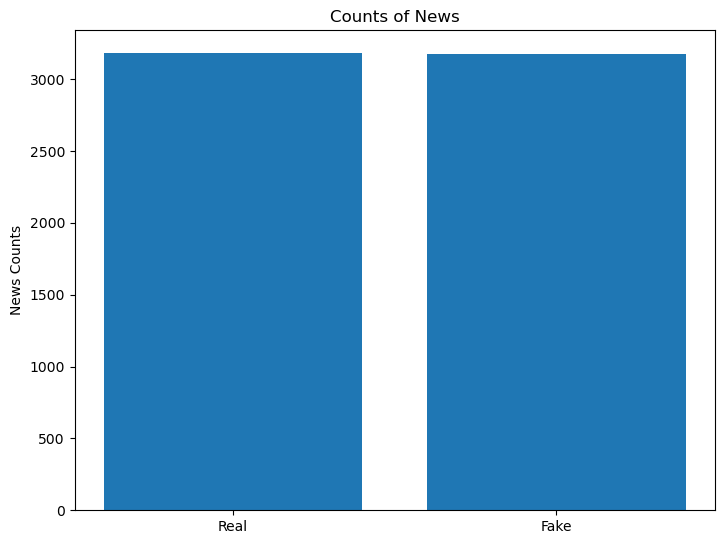

In [29]:
fig = plt.figure()
# plt.figure(figsize=(1,1))
ax = fig.add_axes([0,0,1,1])
labels = ['Real','Fake']
ax.bar(labels,data_fake_real['label'].value_counts())
plt.ylabel('News Counts')
plt.title('Counts of News')
plt.show()

In [30]:
data_fake_real.isnull().sum()

text     0
label    0
dtype: int64

In [31]:
bool_series = data_fake_real.duplicated()
#####data_agency.drop_duplicates
bool_series
print(bool_series.describe())
data_fake_real.index.is_unique

count      6356
unique        2
top       False
freq       6081
dtype: object


True

In [32]:
data_fake_real = data_fake_real.drop_duplicates()

In [33]:
data_fake_real = data_fake_real.reset_index(drop=True)

In [17]:
#create_report(data_fake_real).show()

In [14]:
data_stat = data_fake_real.copy()

In [15]:
data_stat

,text,label
0,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,It's primary day in New York and front-runners...,REAL
...,...,...
6104,RT @entrepreneur_cm: Real or fake text? We can...,FAKE
6105,Real or fake text? We can learn to spot the di...,FAKE
6106,@CTVNews What kinda news? Real or Fake https:/...,FAKE
6107,RT @MADUABU39999734: Breaking News:\r\n\r\nIgb...,REAL


In [81]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data_stat['label'] = encoder.fit_transform(data_stat['label'])

NameError: name 'data_stat' is not defined

In [17]:
data_stat['num_characters'] = data_stat['text'].apply(len)

In [18]:
data_stat['num_words'] = data_stat['text'].apply(lambda x:len(nltk.word_tokenize(x)))

In [22]:
data_stat['num_sentences'] = data_stat['text'].apply(lambda x:len(nltk.sent_tokenize(x)))

<AxesSubplot:xlabel='num_characters', ylabel='Count'>

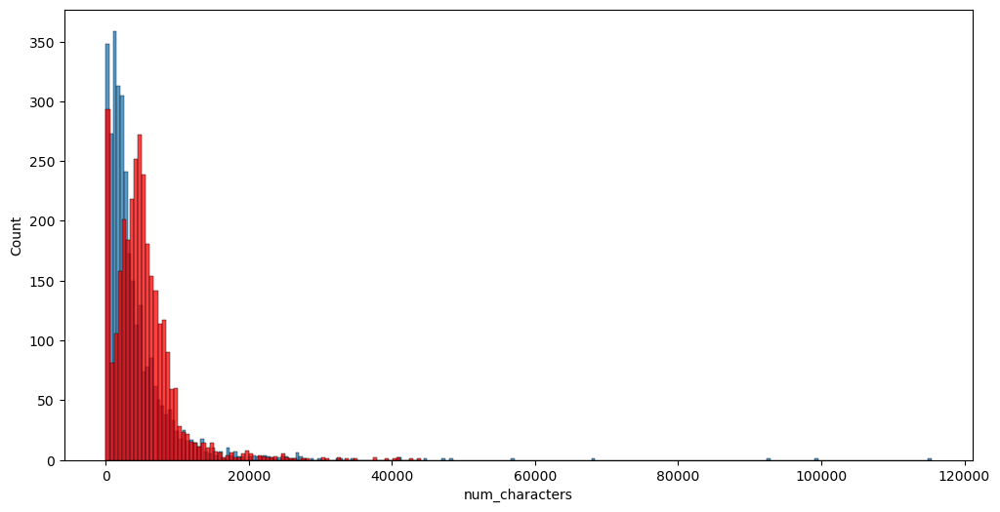

In [23]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_characters'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_characters'],color='red')

<AxesSubplot:xlabel='num_words', ylabel='Count'>

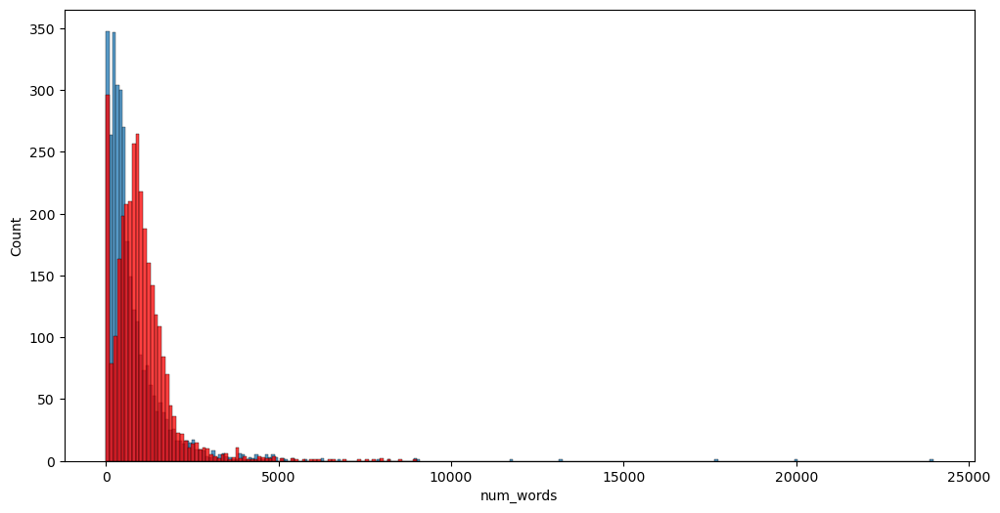

In [24]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_words'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_words'],color='red')

<AxesSubplot:>

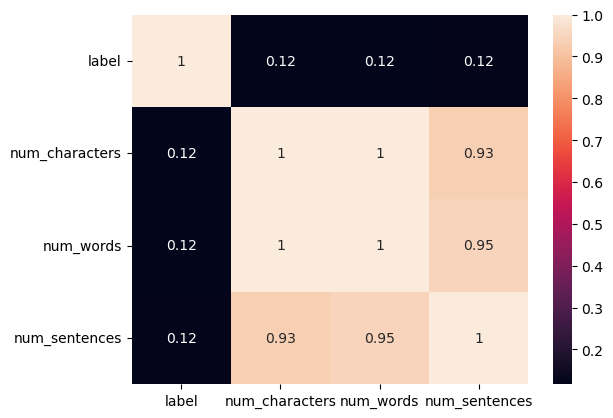

In [25]:
sns.heatmap(data_stat.corr(),annot=True)

# Data Preparation

## Text Cleaning:

In [34]:
data_fake_real["text"]

0       Daniel Greenfield, a Shillman Journalism Fello...
1       Google Pinterest Digg Linkedin Reddit Stumbleu...
2       U.S. Secretary of State John F. Kerry said Mon...
3       — Kaydee King (@KaydeeKing) November 9, 2016 T...
4       It's primary day in New York and front-runners...
                              ...                        
6076    Prostadine Reviews (Exposed Shocking Reviews 2...
6077    Fake News... Edwin Castro isn't even a real pe...
6078    This is about @CLINTOFFICIAL_ starting to sell...
6079                   @atensnut Reach for that fake news
6080    BREAKING NEWS\r\n@piersmorgan comes out in sup...
Name: text, Length: 6081, dtype: object

In [50]:
import spacy

# Load the model with the desired language
nlp = spacy.load("en_core_web_sm")

# Define a function to detect and translate non-English text
def translate_text(text):
    # Detect the language of the text
    doc = nlp(text)
    detected_language = doc.lang_
    
    # Translate the text to English if it's not already in English
    if detected_language != "en":
        translation = doc._.translation["en"]
    else:
        translation = text
    
    return translation


In [1]:
# Apply the translate_text function to the 'text' column of the DataFrame
data_fake_real["text"] = data_fake_real["text"].apply(translate_text)

### LowerCase

In [35]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: x.lower())

In [36]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       u.s. secretary of state john f. kerry said mon...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it's primary day in new york and front-runners...
                              ...                        
6076    prostadine reviews (exposed shocking reviews 2...
6077    fake news... edwin castro isn't even a real pe...
6078    this is about @clintofficial_ starting to sell...
6079                   @atensnut reach for that fake news
6080    breaking news\r\n@piersmorgan comes out in sup...
Name: text, Length: 6081, dtype: object

### Expand the Contractions

In [37]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: contractions.fix(x))

### Remove URLs

In [38]:
def remove_URL(text):
    """
        Remove URLs from a sample string
    """
    return re.sub(r"https?://\S+|www\.\S+", "", text)

In [39]:
# remove urls from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_URL(x))

### Remove HTML tags

In [40]:
def remove_html(text):
    """
        Remove the html in sample text
    """
    html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    return re.sub(html, "", text)

In [41]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_html(x))

In [42]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it is primary day in new york and front-runner...
                              ...                        
6076    prostadine reviews (exposed shocking reviews 2...
6077    fake news... edwin castro is not even a real p...
6078    this is about @clintofficial_ starting to sell...
6079                   @atensnut reach for that fake news
6080    breaking news\r\n@piersmorgan comes out in sup...
Name: text, Length: 6081, dtype: object

### Remove Non-ASCI:

In [43]:
def remove_non_ascii(text):
    """
        Remove non-ASCII characters 
    """
    return re.sub(r'[^\x00-\x7f]',r'', text) # or ''.join([x for x in text if x in string.printable]) 

In [44]:
# remove non-ascii characters from the text
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_non_ascii(x))

### Remove special characters:

In [45]:
def remove_special_characters(text):
    """
        Remove special special characters, including symbols, emojis, and other graphic characters
    """
    emoji_pattern = re.compile(
        '['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+',
        flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [46]:
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_special_characters(x))

In [47]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king (@kaydeeking) november 9, 2016 th...
4       it is primary day in new york and front-runner...
                              ...                        
6076    prostadine reviews (exposed shocking reviews 2...
6077    fake news... edwin castro is not even a real p...
6078    this is about @clintofficial_ starting to sell...
6079                   @atensnut reach for that fake news
6080    breaking news\r\n@piersmorgan comes out in sup...
Name: text, Length: 6081, dtype: object

### Remove punctuations:

In [48]:
def remove_punct(text):
    """
        Remove the punctuation
    """
#     return re.sub(r'[]!"$%&\'()*+,./:;=#@?[\\^_`{|}~-]+', "", text)
    #return text.translate(str.maketrans('', '', string.punctuation))
    exclude = set(string.punctuation) - set(",.")
    return ''.join(ch for ch in text if ch not in exclude)
    

In [49]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_punct(x))

In [50]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king kaydeeking november 9, 2016 the l...
4       it is primary day in new york and frontrunners...
                              ...                        
6076    prostadine reviews exposed shocking reviews 20...
6077    fake news... edwin castro is not even a real p...
6078    this is about clintofficial starting to sell f...
6079                    atensnut reach for that fake news
6080    breaking news\r\npiersmorgan comes out in supp...
Name: text, Length: 6081, dtype: object

### Replace the Typos, slang, acronyms or informal abbreviations

In [51]:
def other_clean(text):
        """
            Other manual text cleaning techniques
        """
        # Typos, slang and other
        sample_typos_slang = {
                                "w/e": "whatever",
                                "usagov": "usa government",
                                "recentlu": "recently",
                                "ph0tos": "photos",
                                "amirite": "am i right",
                                "exp0sed": "exposed",
                                "<3": "love",
                                "luv": "love",
                                "amageddon": "armageddon",
                                "trfc": "traffic",
                                "16yr": "16 year"
                                }

        # Acronyms
        sample_acronyms =  { 
                            "mh370": "malaysia airlines flight 370",
                            "okwx": "oklahoma city weather",
                            "arwx": "arkansas weather",    
                            "gawx": "georgia weather",  
                            "scwx": "south carolina weather",  
                            "cawx": "california weather",
                            "tnwx": "tennessee weather",
                            "azwx": "arizona weather",  
                            "alwx": "alabama weather",
                            "usnwsgov": "united states national weather service",
                            "2mw": "tomorrow"
                            }

        
        # Some common abbreviations 
        sample_abbr = {
                        "$" : " dollar ",
                        "€" : " euro ",
                        "4ao" : "for adults only",
                        "a.m" : "before midday",
                        "a3" : "anytime anywhere anyplace",
                        "aamof" : "as a matter of fact",
                        "acct" : "account",
                        "adih" : "another day in hell",
                        "afaic" : "as far as i am concerned",
                        "afaict" : "as far as i can tell",
                        "afaik" : "as far as i know",
                        "afair" : "as far as i remember",
                        "afk" : "away from keyboard",
                        "app" : "application",
                        "approx" : "approximately",
                        "apps" : "applications",
                        "asap" : "as soon as possible",
                        "asl" : "age, sex, location",
                        "atk" : "at the keyboard",
                        "ave." : "avenue",
                        "aymm" : "are you my mother",
                        "ayor" : "at your own risk", 
                        "b&b" : "bed and breakfast",
                        "b+b" : "bed and breakfast",
                        "b.c" : "before christ",
                        "b2b" : "business to business",
                        "b2c" : "business to customer",
                        "b4" : "before",
                        "b4n" : "bye for now",
                        "b@u" : "back at you",
                        "bae" : "before anyone else",
                        "bak" : "back at keyboard",
                        "bbbg" : "bye bye be good",
                        "bbc" : "british broadcasting corporation",
                        "bbias" : "be back in a second",
                        "bbl" : "be back later",
                        "bbs" : "be back soon",
                        "be4" : "before",
                        "bfn" : "bye for now",
                        "blvd" : "boulevard",
                        "bout" : "about",
                        "brb" : "be right back",
                        "bros" : "brothers",
                        "brt" : "be right there",
                        "bsaaw" : "big smile and a wink",
                        "btw" : "by the way",
                        "bwl" : "bursting with laughter",
                        "c/o" : "care of",
                        "cet" : "central european time",
                        "cf" : "compare",
                        "cia" : "central intelligence agency",
                        "csl" : "can not stop laughing",
                        "cu" : "see you",
                        "cul8r" : "see you later",
                        "cv" : "curriculum vitae",
                        "cwot" : "complete waste of time",
                        "cya" : "see you",
                        "cyt" : "see you tomorrow",
                        "dae" : "does anyone else",
                        "dbmib" : "do not bother me i am busy",
                        "diy" : "do it yourself",
                        "dm" : "direct message",
                        "dwh" : "during work hours",
                        "e123" : "easy as one two three",
                        "eet" : "eastern european time",
                        "eg" : "example",
                        "embm" : "early morning business meeting",
                        "encl" : "enclosed",
                        "encl." : "enclosed",
                        "etc" : "and so on",
                        "faq" : "frequently asked questions",
                        "fawc" : "for anyone who cares",
                        "fb" : "facebook",
                        "fc" : "fingers crossed",
                        "fig" : "figure",
                        "fimh" : "forever in my heart", 
                        "ft." : "feet",
                        "ft" : "featuring",
                        "ftl" : "for the loss",
                        "ftw" : "for the win",
                        "fwiw" : "for what it is worth",
                        "fyi" : "for your information",
                        "g9" : "genius",
                        "gahoy" : "get a hold of yourself",
                        "gal" : "get a life",
                        "gcse" : "general certificate of secondary education",
                        "gfn" : "gone for now",
                        "gg" : "good game",
                        "gl" : "good luck",
                        "glhf" : "good luck have fun",
                        "gmt" : "greenwich mean time",
                        "gmta" : "great minds think alike",
                        "gn" : "good night",
                        "g.o.a.t" : "greatest of all time",
                        "goat" : "greatest of all time",
                        "goi" : "get over it",
                        "gps" : "global positioning system",
                        "gr8" : "great",
                        "gratz" : "congratulations",
                        "gyal" : "girl",
                        "h&c" : "hot and cold",
                        "hp" : "horsepower",
                        "hr" : "hour",
                        "hrh" : "his royal highness",
                        "ht" : "height",
                        "ibrb" : "i will be right back",
                        "ic" : "i see",
                        "icq" : "i seek you",
                        "icymi" : "in case you missed it",
                        "idc" : "i do not care",
                        "idgadf" : "i do not give a damn fuck",
                        "idgaf" : "i do not give a fuck",
                        "idk" : "i do not know",
                        "ie" : "that is",
                        "i.e" : "that is",
                        "ifyp" : "i feel your pain",
                        "IG" : "instagram",
                        "iirc" : "if i remember correctly",
                        "ilu" : "i love you",
                        "ily" : "i love you",
                        "imho" : "in my humble opinion",
                        "imo" : "in my opinion",
                        "imu" : "i miss you",
                        "iow" : "in other words",
                        "irl" : "in real life",
                        "j4f" : "just for fun",
                        "jic" : "just in case",
                        "jk" : "just kidding",
                        "jsyk" : "just so you know",
                        "l8r" : "later",
                        "lb" : "pound",
                        "lbs" : "pounds",
                        "ldr" : "long distance relationship",
                        "lmao" : "laugh my ass off",
                        "lmfao" : "laugh my fucking ass off",
                        "lol" : "laughing out loud",
                        "ltd" : "limited",
                        "ltns" : "long time no see",
                        "m8" : "mate",
                        "mf" : "motherfucker",
                        "mfs" : "motherfuckers",
                        "mfw" : "my face when",
                        "mofo" : "motherfucker",
                        "mph" : "miles per hour",
                        "mr" : "mister",
                        "mrw" : "my reaction when",
                        "ms" : "miss",
                        "mte" : "my thoughts exactly",
                        "nagi" : "not a good idea",
                        "nbc" : "national broadcasting company",
                        "nbd" : "not big deal",
                        "nfs" : "not for sale",
                        "ngl" : "not going to lie",
                        "nhs" : "national health service",
                        "nrn" : "no reply necessary",
                        "nsfl" : "not safe for life",
                        "nsfw" : "not safe for work",
                        "nth" : "nice to have",
                        "nvr" : "never",
                        "nyc" : "new york city",
                        "oc" : "original content",
                        "og" : "original",
                        "ohp" : "overhead projector",
                        "oic" : "oh i see",
                        "omdb" : "over my dead body",
                        "omg" : "oh my god",
                        "omw" : "on my way",
                        "p.a" : "per annum",
                        "p.m" : "after midday",
                        "pm" : "prime minister",
                        "poc" : "people of color",
                        "pov" : "point of view",
                        "pp" : "pages",
                        "ppl" : "people",
                        "prw" : "parents are watching",
                        "ps" : "postscript",
                        "pt" : "point",
                        "ptb" : "please text back",
                        "pto" : "please turn over",
                        "qpsa" : "what happens", #"que pasa",
                        "ratchet" : "rude",
                        "rbtl" : "read between the lines",
                        "rlrt" : "real life retweet", 
                        "rofl" : "rolling on the floor laughing",
                        "roflol" : "rolling on the floor laughing out loud",
                        "rotflmao" : "rolling on the floor laughing my ass off",
                        "rt" : "retweet",
                        "ruok" : "are you ok",
                        "sfw" : "safe for work",
                        "sk8" : "skate",
                        "smh" : "shake my head",
                        "sq" : "square",
                        "srsly" : "seriously", 
                        "ssdd" : "same stuff different day",
                        "tbh" : "to be honest",
                        "tbs" : "tablespooful",
                        "tbsp" : "tablespooful",
                        "tfw" : "that feeling when",
                        "thks" : "thank you",
                        "tho" : "though",
                        "thx" : "thank you",
                        "tia" : "thanks in advance",
                        "til" : "today i learned",
                        "tl;dr" : "too long i did not read",
                        "tldr" : "too long i did not read",
                        "tmb" : "tweet me back",
                        "tntl" : "trying not to laugh",
                        "ttyl" : "talk to you later",
                        "u" : "you",
                        "u2" : "you too",
                        "u4e" : "yours for ever",
                        "utc" : "coordinated universal time",
                        "w/" : "with",
                        "w/o" : "without",
                        "w8" : "wait",
                        "wassup" : "what is up",
                        "wb" : "welcome back",
                        "wtf" : "what the fuck",
                        "wtg" : "way to go",
                        "wtpa" : "where the party at",
                        "wuf" : "where are you from",
                        "wuzup" : "what is up",
                        "wywh" : "wish you were here",
                        "yd" : "yard",
                        "ygtr" : "you got that right",
                        "ynk" : "you never know",
                        "zzz" : "sleeping bored and tired"
                        }
            
        sample_typos_slang_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_typos_slang.keys()) + r')(?!\w)')
        sample_acronyms_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_acronyms.keys()) + r')(?!\w)')
        sample_abbr_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_abbr.keys()) + r')(?!\w)')
        
        text = sample_typos_slang_pattern.sub(lambda x: sample_typos_slang[x.group()], text)
        text = sample_acronyms_pattern.sub(lambda x: sample_acronyms[x.group()], text)
        text = sample_abbr_pattern.sub(lambda x: sample_abbr[x.group()], text)
        
        return text

In [52]:
# remove punctuations from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: other_clean(x))

In [53]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king kaydeeking november 9, 2016 the l...
4       it is primary day in new york and frontrunners...
                              ...                        
6076    prostadine reviews exposed shocking reviews 20...
6077    fake news... edwin castro is not even a real p...
6078    this is about clintofficial starting to sell f...
6079                    atensnut reach for that fake news
6080    breaking news\r\npiersmorgan comes out in supp...
Name: text, Length: 6081, dtype: object

### Spelling Correction

In [95]:
def correct_spelling(text):
    return TextBlob(text).correct()

In [1]:
data_fake_real['text'] = data_fake_real['text'].apply(lambda x: correct_spelling(x))


#### Remove \n


In [54]:
data_fake_real['text']  = data_fake_real['text'] .apply(lambda x: re.sub('\n','', x))

#### Remove Non-English characters

In [55]:
data_fake_real['text']= data_fake_real['text'].apply(lambda x: re.sub(r'[^\x00-\x7f]',r'', x))

### Exploratory Data (Text) analysis:

In [327]:
def create_word_cloud(target_df, column_name):
  print('Joining all words into long text....')
  full_text = ','.join(list(target_df[column_name].values))
  wordcloud = WordCloud(background_color="black", 
                        max_words=100,  # top 100 words in the
                        contour_width=2, 
                        contour_color='yellow')
  print('Creating word cloud')
  wordcloud.generate(full_text)
  return wordcloud

Joining all words into long text....
Creating word cloud


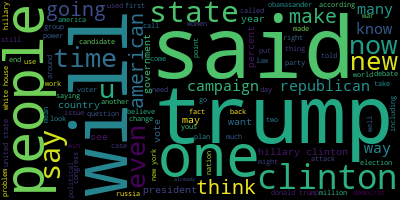

In [328]:
wordcloud = create_word_cloud(data_fake_real, 'text')
wordcloud.to_image()

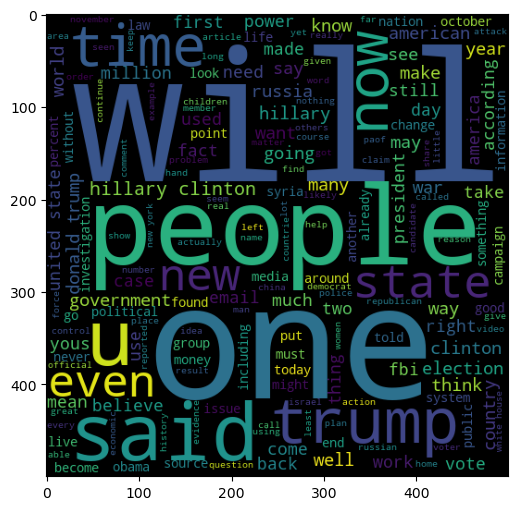

In [329]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
FAKE = wc.generate(data_fake_real[data_fake_real['label'] == 'FAKE']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(FAKE)

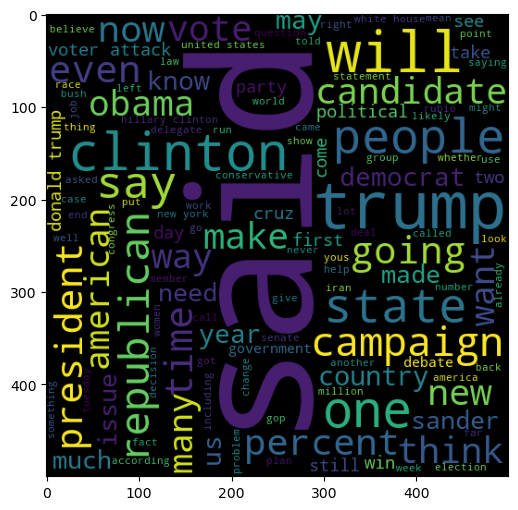

In [330]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
REAL = wc.generate(data_fake_real[data_fake_real['label'] == 'REAL']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(REAL)

## Text Preprocessing:

### Tokenization

In [56]:
stop_words.extend(['has', 'been', 're', 'com', 'edu', 'use'])

In [57]:
# If you set deacc=True which will removes the punctuations (that we already removed)
def convert_sentences_to_words(sentences):
    for sentence in sentences:        
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [58]:
text_to_list = data_fake_real.text.values.tolist()

In [59]:
len(text_to_list)

6081

In [60]:
text_as_words = list(convert_sentences_to_words(text_to_list))

In [61]:
print(text_as_words[0])

['daniel', 'greenfield', 'shillman', 'journalism', 'fellow', 'at', 'the', 'freedom', 'center', 'is', 'new', 'york', 'writer', 'focusing', 'on', 'radical', 'islam', 'in', 'the', 'final', 'stretch', 'of', 'the', 'election', 'hillary', 'rodham', 'clinton', 'has', 'gone', 'to', 'war', 'with', 'the', 'fbi', 'the', 'word', 'unprecedented', 'has', 'been', 'thrown', 'around', 'so', 'often', 'this', 'election', 'that', 'it', 'ought', 'to', 'be', 'retired', 'but', 'it', 'is', 'still', 'unprecedented', 'for', 'the', 'nominee', 'of', 'major', 'political', 'party', 'to', 'go', 'war', 'with', 'the', 'fbi', 'but', 'that', 'is', 'exactly', 'what', 'hillary', 'and', 'her', 'people', 'have', 'done', 'coma', 'patients', 'just', 'waking', 'up', 'now', 'and', 'watching', 'an', 'hour', 'of', 'cnn', 'from', 'their', 'hospital', 'beds', 'would', 'assume', 'that', 'fbi', 'director', 'james', 'comey', 'is', 'hillarys', 'opponent', 'in', 'this', 'election', 'the', 'fbi', 'is', 'under', 'attack', 'by', 'everyone'

### Remove Stop Words


In [62]:
def remove_all_stop_words(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]

In [63]:
clean_words = remove_all_stop_words(text_as_words)

In [130]:
print(clean_words[1])

['google', 'pinterest', 'digg', 'linkedin', 'reddit', 'stumbleupon', 'print', 'delicious', 'pocket', 'tumblr', 'two', 'fundamental', 'truths', 'world', 'paul', 'ryan', 'desperately', 'wants', 'president', 'paul', 'ryan', 'never', 'president', 'today', 'proved', 'particularly', 'staggering', 'example', 'political', 'cowardice', 'paul', 'ryan', 'rererereversed', 'course', 'announced', 'back', 'trump', 'train', 'aboutface', 'weeks', 'ago', 'previously', 'declared', 'would', 'supporting', 'defending', 'trump', 'tape', 'made', 'public', 'trump', 'bragged', 'assaulting', 'women', 'suddenly', 'ryan', 'appearing', 'protrump', 'rally', 'boldly', 'declaring', 'already', 'sent', 'vote', 'make', 'president', 'united', 'states', 'surreal', 'moment', 'figurehead', 'republican', 'party', 'dosed', 'gasoline', 'got', 'stage', 'chilly', 'afternoon', 'wisconsin', 'lit', 'match', 'speakerryan', 'says', 'voted', 'realdonaldtrump', 'republicans', 'time', 'come', 'home', 'pic', 'twitter', 'comwcvscg', 'abc',

## Bigram / Lemmatization


In [64]:
bigram = gensim.models.Phrases(clean_words, min_count=5, threshold=100) 
bigram_mod = gensim.models.phrases.Phraser(bigram)

In [65]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

In [66]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [67]:
import spacy
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

In [68]:
clean_words_bigrams = make_bigrams(clean_words)

In [69]:
clean_words_bigrams[0]

['daniel_greenfield',
 'shillman',
 'journalism',
 'fellow',
 'freedom',
 'center',
 'new_york',
 'writer',
 'focusing',
 'radical_islam',
 'final_stretch',
 'election',
 'hillary_rodham',
 'clinton',
 'gone',
 'war',
 'fbi',
 'word',
 'unprecedented',
 'thrown',
 'around',
 'often',
 'election',
 'ought',
 'retired',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'war',
 'fbi',
 'exactly',
 'hillary',
 'people',
 'done',
 'coma',
 'patients',
 'waking',
 'watching',
 'hour',
 'cnn',
 'hospital',
 'beds',
 'would',
 'assume',
 'fbi_director',
 'james_comey',
 'hillarys',
 'opponent',
 'election',
 'fbi',
 'attack',
 'everyone',
 'obama',
 'cnn',
 'hillarys',
 'people',
 'circulated',
 'letter',
 'attacking',
 'comey',
 'currently',
 'media',
 'hit',
 'pieces',
 'lambasting',
 'targeting',
 'trump',
 'would',
 'surprising',
 'clintons',
 'allies',
 'start',
 'running',
 'attack',
 'ads',
 'fbi',
 'fbis',
 'leadership',
 'warned',
 'entire',
 'leftwing'

In [70]:
clean_words_lemmatized = lemmatization(clean_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [158]:
clean_words_lemmatized = lemmatization(clean_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [71]:
clean_words_lemmatized[0]

['shillman',
 'journalism',
 'fellow',
 'new_york',
 'writer',
 'focus',
 'final_stretch',
 'election',
 'go',
 'war',
 'word',
 'unprecedented',
 'throw',
 'around',
 'often',
 'election',
 'retire',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'exactly',
 'people',
 'do',
 'coma',
 'patient',
 'wake',
 'watch',
 'hour',
 'hospital',
 'bed',
 'assume',
 'fbi_director',
 'opponent',
 'attack',
 'people',
 'circulate',
 'letter',
 'attack',
 'currently',
 'medium',
 'hit',
 'piece',
 'lambaste',
 'target',
 'trump',
 'surprising',
 'clinton',
 'ally',
 'start',
 'run',
 'attack',
 'ad',
 'fbis',
 'leadership',
 'warn',
 'entire',
 'leftwe',
 'establishment',
 'form',
 'continue',
 'go',
 'attack',
 'medium',
 'preemptively',
 'head',
 'result',
 'covert',
 'struggle',
 'fbi_agent',
 'people',
 'go',
 'explosively',
 'public',
 'new_york',
 'time',
 'compare',
 'comey',
 'edgar_hoover',
 'bizarre',
 'headline',
 'role',
 'recall',
 'hoover',
 'fairly'

### Analyze Fake or Real

In [352]:
data_Mytext = pd.DataFrame({'text': clean_words_lemmatized})

In [353]:
data_Mytext['text'] = data_Mytext['text'].apply(lambda x: ' '.join(x))

In [354]:
data_fake_real['text']=data_Mytext['text']

In [355]:
#we will work on fake
fake_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "FAKE"]['text'].tolist():
    for word in msg.split():
        fake_corpus.append(word)

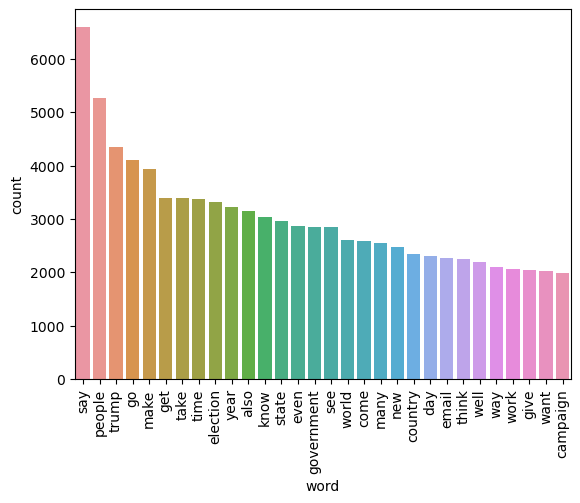

In [356]:
# count the frequency of each word in fake_corpus
word_counts = Counter(fake_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

In [357]:
#we will work on real
real_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "REAL"]['text'].tolist():
    for word in msg.split():
        real_corpus.append(word)

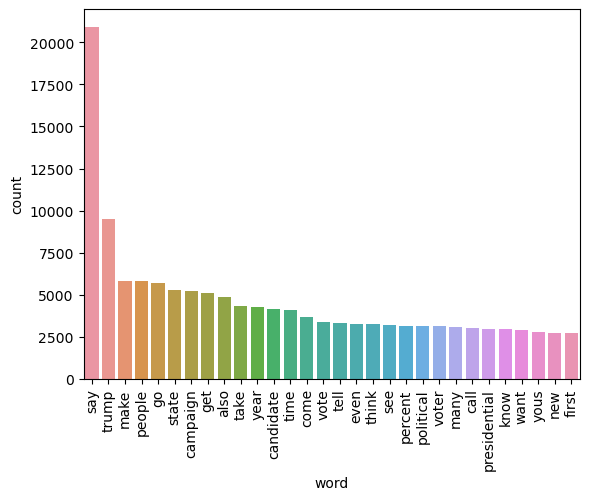

In [358]:
# count the frequency of each word in fake_corpus
word_counts = Counter(real_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

### Part of Speech Tagging (POS Tagging):

In [359]:
def pos_tagging_nltk(tokens):
    return [nltk.pos_tag(w) for w in tokens if w]

In [360]:
pos_tagging_nltk(clean_words_lemmatized)

[[('shillman', 'JJ'),
  ('journalism', 'NN'),
  ('fellow', 'JJ'),
  ('new_york', 'NN'),
  ('writer', 'NN'),
  ('focus', 'NN'),
  ('final_stretch', 'NN'),
  ('election', 'NN'),
  ('go', 'VBP'),
  ('war', 'NN'),
  ('word', 'NN'),
  ('unprecedented', 'JJ'),
  ('throw', 'NN'),
  ('around', 'RB'),
  ('often', 'RB'),
  ('election', 'NN'),
  ('retire', 'NN'),
  ('still', 'RB'),
  ('unprecedented', 'VBD'),
  ('nominee', 'JJ'),
  ('major', 'JJ'),
  ('political', 'JJ'),
  ('party', 'NN'),
  ('go', 'VBP'),
  ('exactly', 'RB'),
  ('people', 'NNS'),
  ('do', 'VBP'),
  ('coma', 'VB'),
  ('patient', 'JJ'),
  ('wake', 'NN'),
  ('watch', 'VB'),
  ('hour', 'NN'),
  ('hospital', 'NN'),
  ('bed', 'VBD'),
  ('assume', 'JJ'),
  ('fbi_director', 'NN'),
  ('opponent', 'JJ'),
  ('attack', 'NN'),
  ('people', 'NNS'),
  ('circulate', 'VBP'),
  ('letter', 'NN'),
  ('attack', 'NN'),
  ('currently', 'RB'),
  ('medium', 'RBS'),
  ('hit', 'VBN'),
  ('piece', 'JJ'),
  ('lambaste', 'NN'),
  ('target', 'NN'),
  ('trump'

## Tokenizing

In [ ]:
text_to_Sentence = data_fake_real['text'].apply(lambda x:nltk.sent_tokenize(x))

In [160]:
text_to_Sentence[0]

['daniel greenfield, a shillman journalism fellow at the freedom center, is a new york writer focusing on radical islam.',
 'in the final stretch of the election, hillary rodham clinton has gone to war with the fbi.',
 'the word unprecedented has been thrown around so often this election that it ought to be retired.',
 'but it is still unprecedented for the nominee of a major political party to go war with the fbi.',
 'but that is exactly what hillary and her people have done.',
 'coma patients just waking up now and watching an hour of cnn from their hospital beds would assume that fbi director james comey is hillarys opponent in this election.',
 'the fbi is under attack by everyone from obama to cnn.',
 'hillarys people have circulated a letter attacking comey.',
 'there are currently more media hit pieces lambasting him than targeting trump.',
 'it would not be too surprising if the clintons or their allies were to start running attack ads against the fbi.',
 'the fbis leadership i

In [161]:
id2word = corpora.Dictionary(text_to_Sentence)

In [162]:
texts = text_to_Sentence

In [163]:
corpus = [id2word.doc2bow(text) for text in texts]

In [164]:
print(corpus[0])

[(0, 1), (1, 1), (2, 1), (3, 1), (4, 1), (5, 1), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 1), (14, 1), (15, 1), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1), (25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 1), (39, 1), (40, 1), (41, 1), (42, 1), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 1), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 1), (76, 1), (77, 1), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1)]


## Topic Model

In [108]:
num_topics = 10

In [109]:
# Using Gensin to build the LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus, 
                                       id2word=id2word, 
                                       num_topics=num_topics,
                                       )

In [110]:
# Print the Keyword in the N (=num_topics) topics
from pprint import pprint
pprint(lda_model.print_topics())
#pprint(lda_model.print_topics(N))

[(0,
  '0.000*"mister." + 0.000*"brain force  25 off 34.95 22.46 flip the switch '
  'and supercharge your state of mind with brain force the next generation of '
  'neural activation from infowars life." + 0.000*"the you.s." + 0.000*"please '
  'like and share this story on facebook or twitter." + 0.000*"here is a '
  'selection of their comments." + 0.000*"support the trump movement and help '
  'us fight liberal media bias." + 0.000*"you can follow her on twitter here '
  'and facebook here ." + 0.000*"..." + 0.000*"a variety of celebrities and '
  'other public figures across a variety of faiths  and none  have expressed '
  'their support for pope francis." + 0.000*"loading ..."'),
 (1,
  '0.000*"the you.s." + 0.000*"mister." + 0.000*"et." + 0.000*"you.s." + '
  '0.000*"share" + 0.000*"related articles" + 0.000*"gov." + 0.000*"..." + '
  '0.000*"tags" + 0.000*"he is the author of five books and is based in '
  'washington."'),
 (2,
  '0.000*"mister." + 0.000*"the you.s." + 0.000*"

In [111]:
for i, topic in lda_model.show_topics(num_topics=10, num_words=10, formatted=False):
    print("Topic {}: {}".format(i, " ".join([word for word, _ in topic])))

Topic 0: mister. brain force  25 off 34.95 22.46 flip the switch and supercharge your state of mind with brain force the next generation of neural activation from infowars life. the you.s. please like and share this story on facebook or twitter. here is a selection of their comments. support the trump movement and help us fight liberal media bias. you can follow her on twitter here and facebook here . ... a variety of celebrities and other public figures across a variety of faiths  and none  have expressed their support for pope francis. loading ...
Topic 1: the you.s. mister. et. you.s. share related articles gov. ... tags he is the author of five books and is based in washington.
Topic 2: mister. the you.s. you.s. proven true. post navigation source at this moment there is less than two weeks to go until november 8th, and a brand new survey has found that a majority of americans are concerned about the possibility of violence on election day a 51 majority of likely voters express at 

In [165]:
doc_lda = lda_model[corpus]

In [166]:
doc_lda

# Analyzing the LDA Model

In [167]:
# Visualize the topics
pyLDAvis.enable_notebook()

In [168]:
LDAvis_data_filepath = os.path.join('ldavis_prepared_'+str(num_topics))

In [169]:
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)

In [170]:
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)

In [171]:
pyLDAvis.save_html(LDAvis_prepared, 'ldavis_prepared_'+ str(num_topics) +'.html')

In [172]:
LDAvis_prepared 

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
7     -0.004276 -0.074764       1        1  10.888149
6     -0.036626  0.011095       2        1  10.547578
5     -0.022858 -0.068510       3        1  10.258268
9     -0.048245  0.028947       4        1  10.202619
8      0.067183 -0.002314       5        1  10.063814
4      0.065124  0.040265       6        1  10.019866
3     -0.023124  0.040906       7        1   9.723904
2      0.011842  0.004268       8        1   9.661014
0      0.032035 -0.011338       9        1   9.383568
1     -0.041056  0.031444      10        1   9.251220, topic_info=                                                     Term       Freq  \
3477                                                  et.  43.000000   
5106    brain force  25 off 34.95 22.46 flip the switc...  18.000000   
100286             here is a selection of their comments.   4.000000   
1055                                              mister.  76.000000   
3474                                  and 5 after midday.  14.000000   
...                                                   ...        ...   
469     newsletter sign up get the latest breaking new...   1.207917   
36239                                             period.   1.238240   
4469                                      new jersey gov.   1.219753   
361                                  all rights reserved.   1.216974   
3644                      billy okeefe, mcclatchy tribune   1.192214   

            Total Category  logprob  loglift  
3477    43.000000  Default  30.0000  30.0000  
5106    18.000000  Default  29.0000  29.0000  
100286   4.000000  Default  28.0000  28.0000  
1055    76.000000  Default  27.0000  27.0000  
3474    14.000000  Default  26.0000  26.0000  
...           ...      ...      ...      ...  
469      7.082178  Topic10  -9.4138   0.6117  
36239   11.178146  Topic10  -9.3890   0.1801  
4469    12.249237  Topic10  -9.4040   0.0736  
361     12.045939  Topic10  -9.4063   0.0881  
3644     8.298477  Topic10  -9.4268   0.4402  

[670 rows x 6 columns], token_table=       Topic      Freq                                               Term
term                                                                     
32121      1  0.176678    arnaldo rodgers is a trained and educated ps...
32121      2  0.176678    arnaldo rodgers is a trained and educated ps...
32121      4  0.176678    arnaldo rodgers is a trained and educated ps...
32121      5  0.176678    arnaldo rodgers is a trained and educated ps...
32121      6  0.176678    arnaldo rodgers is a trained and educated ps...
...      ...       ...                                                ...
117        9  0.047312                                             you.s.
117       10  0.118280                                             you.s.
42960      4  0.497360  your information will never be shared with any...
42960      8  0.248680  your information will never be shared with any...
42960     10  0.248680  your information will never be shared with any...

[1116 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[8, 7, 6, 10, 9, 5, 4, 3, 1, 2])

# Model Building

In [72]:
data_Modeling = pd.DataFrame({'text': clean_words_lemmatized})

In [73]:
data_Modeling['text'] = data_Modeling['text'].apply(lambda x: ' '.join(x))

In [74]:
data_fake_real['text']=data_Modeling['text']

In [75]:
data_fake_real['text']

0       shillman journalism fellow new_york writer foc...
1       reddit_stumbleupon print_delicious fundamental...
2       secretary_state say stop later week criticism ...
3       kaydeeke lesson tonight dem loss time start li...
4       primary day lead poll trump vow win enough del...
                              ...                        
6076    prostadine review expose shocking review prost...
6077    fake news even real person government win lott...
6078    clintofficial start sell fake autograph accoun...
6079                                      reach fake news
6080    breaking_new piersmorgan come support garyline...
Name: text, Length: 6081, dtype: object

In [76]:
data_fake_real.columns

Index(['text', 'label'], dtype='object')

In [77]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
cv = CountVectorizer()
tfidf = TfidfVectorizer(max_features=3000)

In [78]:
X = tfidf.fit_transform(data_fake_real['text']).toarray()

In [79]:
X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [82]:
data_fake_real['label'] = encoder.fit_transform(data_fake_real['label'])

In [83]:
y = data_fake_real['label'].values

In [84]:
y

array([0, 0, 1, ..., 0, 0, 1])

In [85]:
from sklearn.model_selection import train_test_split

In [89]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)
print ('Train set:', X_train.shape,  y_train.shape)
print ('Test set:', X_test.shape,  y_test.shape)

Train set: (4864, 3000) (4864,)
Test set: (1217, 3000) (1217,)


In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc, roc_curve, recall_score, 
                             classification_report, f1_score, accuracy_score, average_precision_score, precision_recall_fscore_support)

In [200]:
svc = SVC(kernel='sigmoid', gamma=1.0)
knc = KNeighborsClassifier()
mnb = MultinomialNB()
dtc = DecisionTreeClassifier(max_depth=5)
lrc = LogisticRegression(solver='liblinear', penalty='l1')
rfc = RandomForestClassifier(n_estimators=50, random_state=2)
abc = AdaBoostClassifier(n_estimators=50, random_state=2)
bc = BaggingClassifier(n_estimators=50, random_state=2)
etc = ExtraTreesClassifier(n_estimators=50, random_state=2)
gbdt = GradientBoostingClassifier(n_estimators=50,random_state=2)
xgb = XGBClassifier(n_estimators=50,random_state=2)

In [203]:
clfs = {
    'SVC' : svc,
    'KN' : knc, 
    'NB': mnb, 
    'DT': dtc, 
    'LR': lrc, 
    'RF': rfc, 
    'AdaBoost': abc, 
}

In [204]:
def train_classifier(clf,X_train,y_train,X_test,y_test):
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    
    return accuracy,precision

In [205]:
accuracy_scores = []
precision_scores = []

for name,clf in clfs.items():
    
    current_accuracy,current_precision = train_classifier(clf, X_train,y_train,X_test,y_test)
    
    print("For ",name)
    print("Accuracy - ",current_accuracy)
    print("Precision - ",current_precision)
    
    accuracy_scores.append(current_accuracy)
    precision_scores.append(current_precision)

For  SVC
Accuracy -  0.9034369885433715
Precision -  0.9150442477876106
For  KN
Accuracy -  0.8445171849427169
Precision -  0.8915187376725838
For  NB
Accuracy -  0.88379705400982
Precision -  0.8582930756843801
For  DT
Accuracy -  0.7643207855973814
Precision -  0.7504187604690117
For  LR
Accuracy -  0.8608837970540099
Precision -  0.8825688073394495
For  RF
Accuracy -  0.8404255319148937
Precision -  0.8426573426573427
For  AdaBoost
Accuracy -  0.8387888707037643
Precision -  0.8469750889679716


In [ ]:
performance_df = pd.DataFrame({'Algorithm':clfs.keys(),'Accuracy':accuracy_scores,'Precision':precision_scores}).sort_values('Accuracy',ascending=False)

In [ ]:
performance_df

In [103]:
#data_fake_real['text'][0]

In [209]:
from keras.models import Sequential
from keras.layers import Dense,Embedding,LSTM,Dropout
import keras
from keras.preprocessing import text,sequence

In [206]:
batch_size = 256
epochs = 10
embed_size = 100
max_features = 7000
maxlen = 300

In [207]:
X_train, X_test, y_train, y_test = train_test_split(data_fake_real['text'], data_fake_real['label'], random_state=0)

In [210]:
tokenizer = text.Tokenizer(num_words=max_features)
tokenizer.fit_on_texts(X_train)
tokenized_train = tokenizer.texts_to_sequences(X_train)
X_train = keras.utils.pad_sequences(tokenized_train, maxlen=maxlen)

In [211]:
tokenized_test = tokenizer.texts_to_sequences(X_test)
X_test =keras.utils.pad_sequences(tokenized_test, maxlen=maxlen)

In [212]:
model = Sequential()
#Non-trainable embeddidng layer
model.add(Embedding(max_features, output_dim=embed_size, input_length=maxlen, trainable=False))
#LSTM 
model.add(LSTM(units=128 , return_sequences = True , recurrent_dropout = 0.25 , dropout = 0.25))
model.add(LSTM(units=64 , recurrent_dropout = 0.1 , dropout = 0.1))
model.add(Dense(units = 32 , activation = 'relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer=keras.optimizers.Adam(lr = 0.01), loss='binary_crossentropy', metrics=['accuracy'])

In [213]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 300, 100)          700000    
                                                                 
 lstm (LSTM)                 (None, 300, 128)          117248    
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 dense (Dense)               (None, 32)                2080      
                                                                 
 dense_1 (Dense)             (None, 1)                 33        
                                                                 
Total params: 868,769
Trainable params: 168,769
Non-trainable params: 700,000
_________________________________________________________________


In [ ]:
istory = model.fit(X_train, y_train, validation_split=0.3, epochs=10, batch_size=batch_size, shuffle=True, verbose = 1)

Epoch 1/10
13/13 [==============================] - 208s 16s/step - loss: 0.6987 - accuracy: 0.5387 - val_loss: 0.6305 - val_accuracy: 0.6662
Epoch 2/10
13/13 [==============================] - 195s 15s/step - loss: 0.6818 - accuracy: 0.5761 - val_loss: 0.6877 - val_accuracy: 0.5207
Epoch 3/10
 9/13 [===================>..........] - ETA: 1:00 - loss: 0.6749 - accuracy: 0.5885

In [119]:
print("Accuracy of the model on Training Data is - " , model.evaluate(X_train,y_train)[1]*100 , "%")
print("Accuracy of the model on Testing Data is - " , model.evaluate(X_test,y_test)[1]*100 , "%")

144/144 [==============================] - 23s 160ms/step - loss: 0.6934 - accuracy: 0.4861
Accuracy of the model on Training Data is -  48.61384034156799 %
48/48 [==============================] - 9s 178ms/step - loss: 0.6935 - accuracy: 0.4692
Accuracy of the model on Testing Data is -  46.924084424972534 %


In [118]:
pred =(model.predict(X_test) > 0.5).astype("int32")
print(classification_report(y_test, pred, target_names = ['Fake','Real']))

48/48 [==============================] - 7s 135ms/step
              precision    recall  f1-score   support

        Fake       0.39      0.02      0.04       801
        Real       0.47      0.96      0.63       727

    accuracy                           0.47      1528
   macro avg       0.43      0.49      0.34      1528
weighted avg       0.43      0.47      0.32      1528



# SVC

In [ ]:
# define the parameter grid for the SVMs
param_grid = {'C': [0.1, 1, 10, 20],
              'kernel': ['linear', 'rbf', 'sigmoid', 'poly'],
              'gamma': ['scale', 'auto', 0.1, 1, 10],
              'degree': [2, 3, 4, 5]}

# instantiate an SVMs model
svm = SVC()

# instantiate a GridSearchCV object and pass in the SVMs model and parameter grid
grid_search = GridSearchCV(svm, param_grid, cv=5)

# fit the GridSearchCV object to the training data
grid_search.fit(X_train, y_train)

# extract the best hyperparameters from the GridSearchCV object
best_params = grid_search.best_params_

# evaluate the SVMs model with the best hyperparameters on the testing data
svm_best = SVC(**best_params)
svm_best.fit(X_train, y_train)
y_pred = svm_best.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)